In [1]:
import cv2
import numpy as np,sys
import matplotlib.pyplot as plt
import os

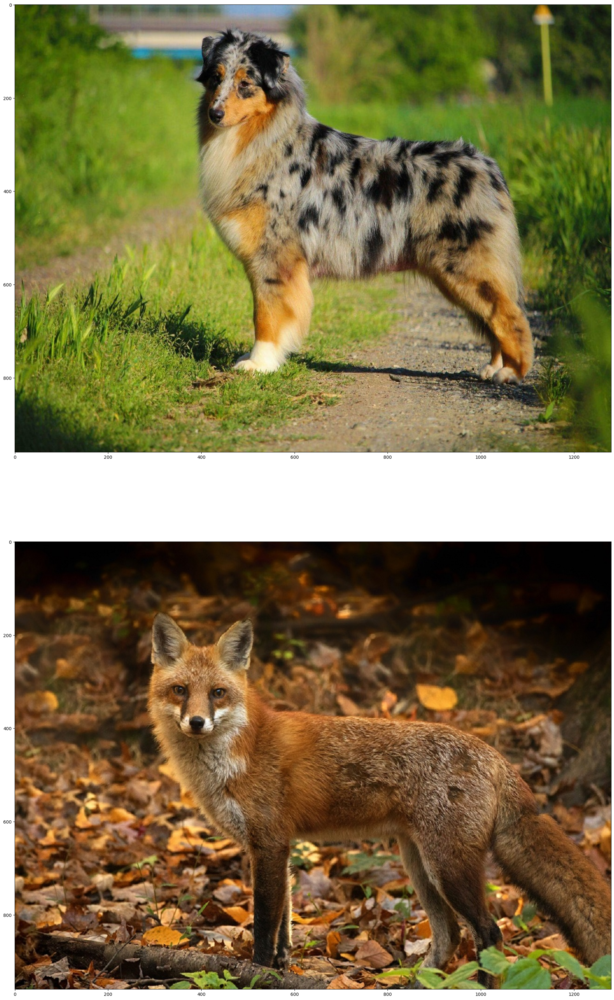

In [14]:
n = 10
curpath = os.getcwd()
path1 = f'{curpath}//4//1.jpg'
path2 = f'{curpath}//4//2.jpg'
img1 = cv2.imread(path1)
img2 = cv2.imread(path2)
img2 = np.resize(img2, img1.shape)
fig = plt.figure(figsize=(40, 40))
showedimg1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
fig.add_subplot(2, 1, 1)
plt.imshow(showedimg1)
showedimg2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
fig.add_subplot(2, 1, 2)
plt.imshow(showedimg2)
plt.show()

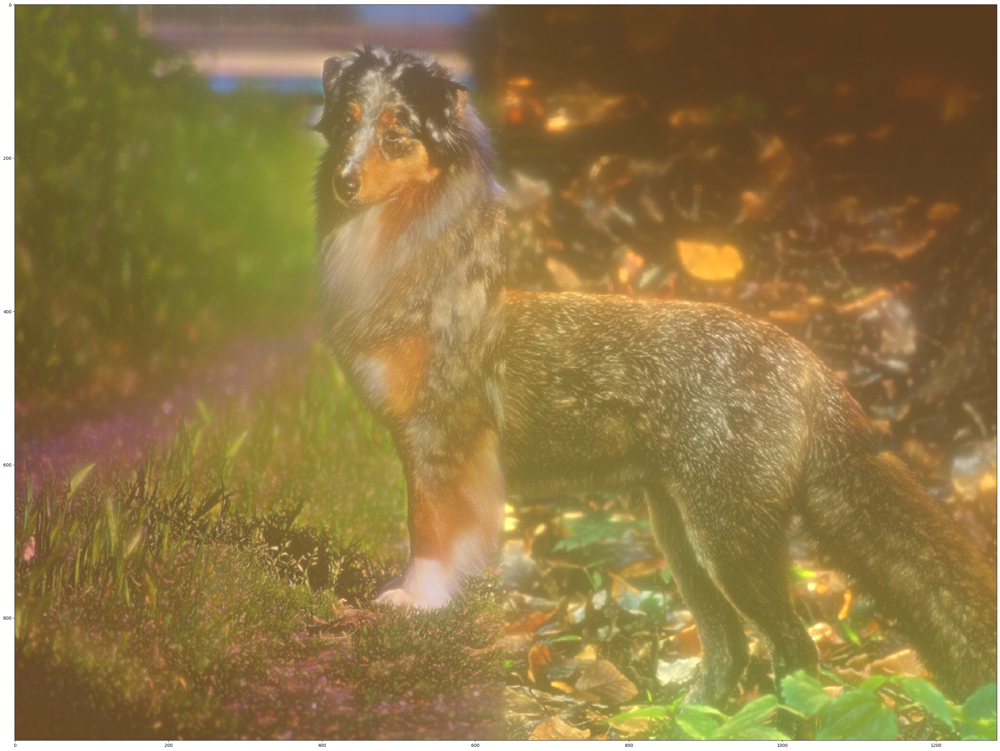

In [15]:
gaus = [img1]
for i in range(n):
    gaus.append(cv2.pyrDown(gaus[i]))
lapl1 = [gaus[n-1]]
for i in range(n-1, 0, -1):
    t = cv2.pyrUp(gaus[i])
    if(np.prod(t.shape) < np.prod(gaus[i-1].shape)):
        gaus[i-1] = np.resize(gaus[i-1], t.shape)
    else:
        t = np.resize(t, gaus[i-1].shape)
    lapl1.append(cv2.subtract(gaus[i-1], t))
    
gaus = [img2]
for i in range(n):
    gaus.append(cv2.pyrDown(gaus[i]))
lapl2 = [gaus[n-1]]
for i in range(n-1, 0, -1):
    t = cv2.pyrUp(gaus[i])
    if(np.prod(t.shape) < np.prod(gaus[i-1].shape)):
        gaus[i-1] = np.resize(gaus[i-1], t.shape)
    else:
        t = np.resize(t, gaus[i-1].shape)
    lapl2.append(cv2.subtract(gaus[i-1], t))
    
LS = []
for la,lb in zip(lapl1, lapl2):
    rows,cols,dpt = la.shape
    ls = np.hstack((la[:,0:cols//2], lb[:,cols//2:]))
    LS.append(ls)
ls = LS[0]
for i in range(1,n):
    ls = cv2.pyrUp(ls)
    if(np.prod(ls.shape) < np.prod(LS[i].shape)):
        LS[i] = np.resize(LS[i], ls.shape)
    else:
        ls = np.resize(ls, LS[i].shape)
    ls = cv2.add(ls, LS[i])
    
finalimg = cv2.cvtColor(ls, cv2.COLOR_BGR2RGB)
_, axes = plt.subplots(figsize=(40,40))
axes.imshow(finalimg)